In [1]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import QuantileTransformer
from utils import preprocessing, set_index
from matplotlib import pyplot as plt


In [2]:
#path = '../../Datasets/TELCO/'
path = "/home/gastong/Documentos/TELCO/v0/" #Rosaluna
filenames = ["TELCO_data_2021_01.zip", "TELCO_data_2021_02.zip", "TELCO_data_2021_03.zip", "TELCO_data_2021_04.zip"]
files = [path+ i for i in filenames]

In [3]:
# Load data and predictions
# Read CSV files from List
data = pd.concat(map(pd.read_csv, files))
data = set_index(data)
data = preprocessing(data, flag_scaler=False, outliers=True)
data

,TS1,TS2,TS3,TS4,TS5,TS6,TS7,TS8,TS9,TS10,TS11,TS12
time,,,,,,,,,,,,
2021-01-01 00:00:00,1.408747,0.544321,0.650146,0.898870,1.232562,0.650271,0.974761,1.112501,0.688676,1.338900,-0.720160,-0.740090
2021-01-01 00:05:00,1.355641,0.441596,0.650146,0.927737,1.225249,0.868799,0.462581,0.658421,0.688676,1.338900,-0.720160,-0.740090
2021-01-01 00:10:00,1.257673,0.417989,1.435568,0.982016,1.167777,0.596940,0.367272,0.556485,0.688676,1.338900,-0.720160,-0.740090
2021-01-01 00:15:00,1.336637,0.371412,1.435568,0.771733,1.195071,0.603444,0.392267,0.510150,-0.613358,0.105026,-0.744758,-0.749811
2021-01-01 00:20:00,1.227964,0.300908,0.400979,0.456751,1.446794,2.497350,0.276924,0.398947,-0.613358,0.105026,-0.744758,-0.749811
...,...,...,...,...,...,...,...,...,...,...,...,...
2021-04-30 23:35:00,0.872900,0.360565,0.178326,1.364939,0.169353,0.230126,0.727749,0.843760,-0.171614,0.369428,-0.290221,-0.341492
2021-04-30 23:40:00,0.833591,0.300908,0.666370,0.669039,-0.006152,0.152080,0.615631,0.714023,-0.171614,0.369428,-0.290221,-0.341492
2021-04-30 23:45:00,0.949525,0.328344,0.666370,0.562610,0.236280,0.284758,0.729458,0.843760,0.875887,1.250766,-0.439869,-0.477599


In [4]:
data_norm_quant = data/data.quantile(0.98)

In [5]:
data_norm_quant.quantile(0.95)

TS1     0.844360
TS2     0.884825
TS3     0.712433
TS4     0.822165
TS5     0.814295
TS6     0.829577
TS7     0.851379
TS8     0.862471
TS9     0.667935
TS10    0.793317
TS11    0.781661
TS12    0.787751
Name: 0.95, dtype: float64

#### Prueba del quantil transformer

In [6]:
qt = QuantileTransformer(n_quantiles=10000, output_distribution='normal')

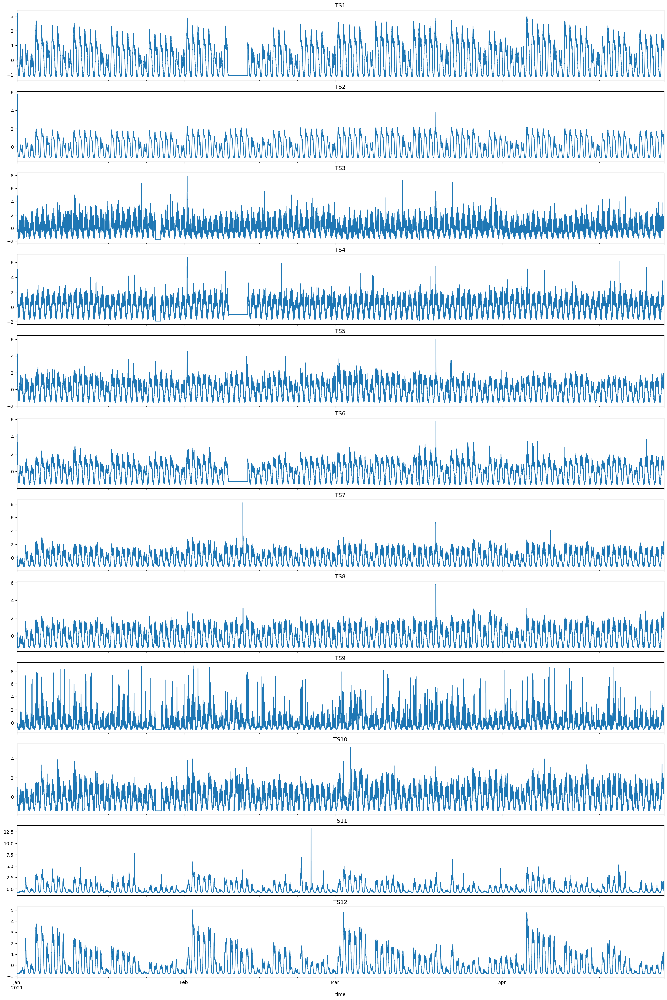

In [7]:
#define number of rows and columns for subplots
nrow=12
ncol=1

columns_list = data.columns

time_start = '2021-01-01'
time_end = '2021-04-30'
fig, axes = plt.subplots(nrow, ncol, figsize=(20,30), constrained_layout=True, sharex=True)

# plot counter
count=0

for r in range(nrow):
    for c in range(ncol):
        data[columns_list[count]][time_start:time_end].plot(ax=axes[r])
        axes[r].set_title(columns_list[count])
        count+=1

In [8]:
data_norm_quant

,TS1,TS2,TS3,TS4,TS5,TS6,TS7,TS8,TS9,TS10,TS11,TS12
time,,,,,,,,,,,,
2021-01-01 00:00:00,0.669807,0.291153,0.276826,0.536529,0.737581,0.361280,0.533274,0.635018,0.203607,0.627971,-0.268171,-0.260819
2021-01-01 00:05:00,0.644557,0.236206,0.276826,0.553759,0.733205,0.482691,0.253070,0.375829,0.203607,0.627971,-0.268171,-0.260819
2021-01-01 00:10:00,0.597977,0.223579,0.611251,0.586158,0.698813,0.331650,0.200928,0.317643,0.203607,0.627971,-0.268171,-0.260819
2021-01-01 00:15:00,0.635521,0.198665,0.611251,0.460641,0.715146,0.335264,0.214602,0.291195,-0.181339,0.049259,-0.277331,-0.264245
2021-01-01 00:20:00,0.583851,0.160953,0.170733,0.272631,0.865780,1.387487,0.151500,0.227720,-0.181339,0.049259,-0.277331,-0.264245
...,...,...,...,...,...,...,...,...,...,...,...,...
2021-04-30 23:35:00,0.415032,0.192863,0.075930,0.814721,0.101343,0.127854,0.398138,0.481620,-0.050738,0.173269,-0.108072,-0.120347
2021-04-30 23:40:00,0.396342,0.160953,0.283734,0.399344,-0.003682,0.084493,0.336801,0.407566,-0.050738,0.173269,-0.108072,-0.120347
2021-04-30 23:45:00,0.451464,0.175628,0.283734,0.335817,0.141393,0.158207,0.399073,0.481620,0.258956,0.586635,-0.163797,-0.168313


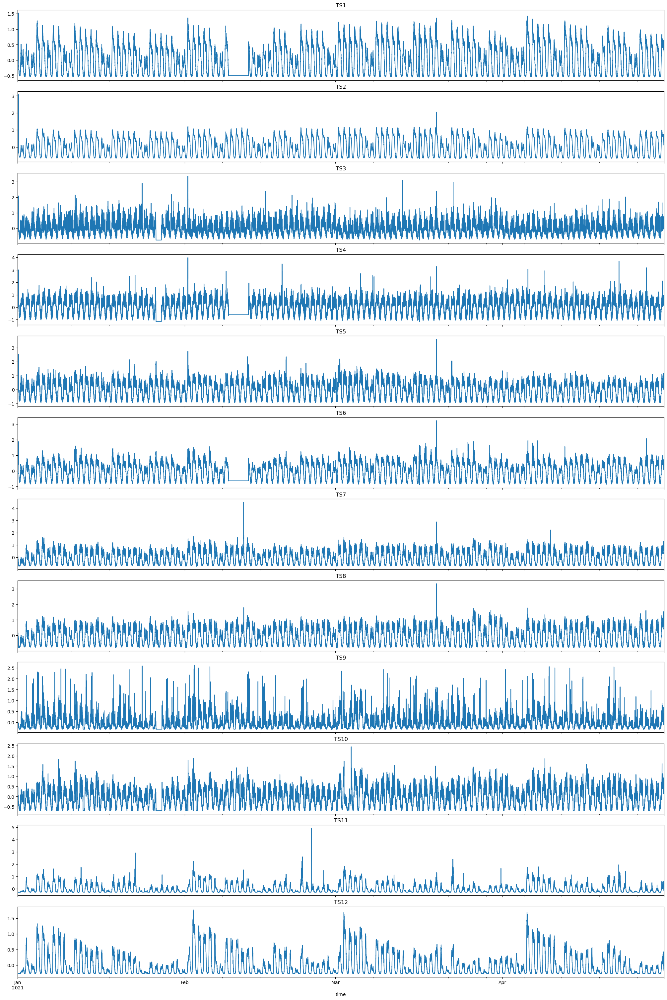

In [9]:
#define number of rows and columns for subplots
nrow=12
ncol=1

columns_list = data.columns

time_start = '2021-01-01'
time_end = '2021-04-30'
fig, axes = plt.subplots(nrow, ncol, figsize=(20,30), constrained_layout=True, sharex=True)

# plot counter
count=0

for r in range(nrow):
    for c in range(ncol):
        data_norm_quant[columns_list[count]][time_start:time_end].plot(ax=axes[r])
        axes[r].set_title(columns_list[count])
        count+=1

In [10]:
data_qt = qt.fit_transform(data)

In [11]:
data_qt = pd.DataFrame(data_qt, index=data.index, columns=data.columns)

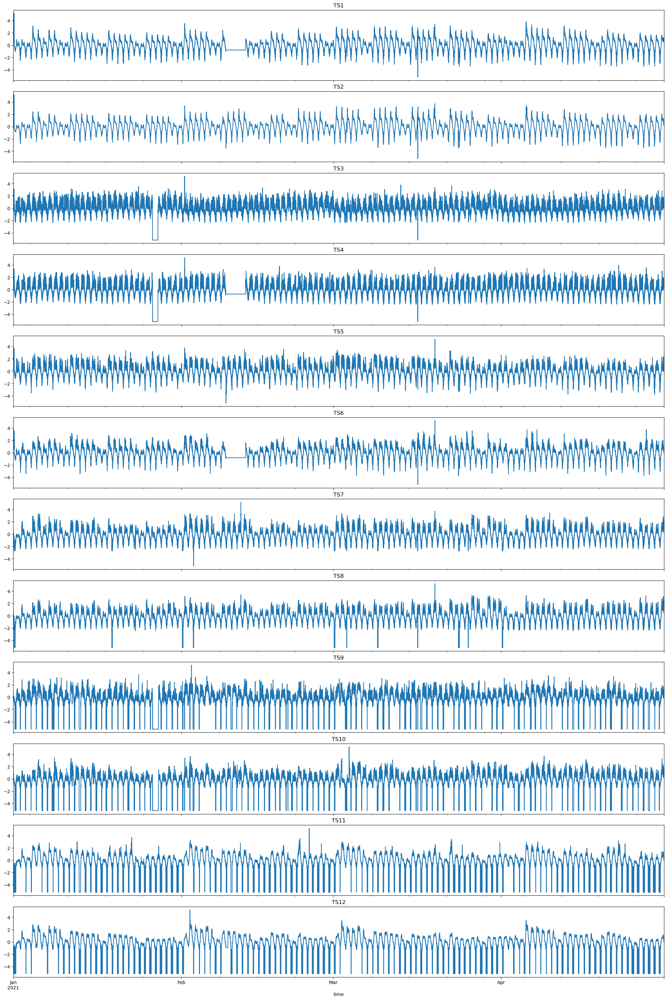

In [12]:
#define number of rows and columns for subplots
nrow=12
ncol=1

columns_list = data_qt.columns

time_start = '2021-01-01'
time_end = '2021-04-30'
fig, axes = plt.subplots(nrow, ncol, figsize=(20,30), constrained_layout=True, sharex=True)

# plot counter
count=0

for r in range(nrow):
    for c in range(ncol):
        data_qt[columns_list[count]][time_start:time_end].plot(ax=axes[r])
        axes[r].set_title(columns_list[count])
        count+=1

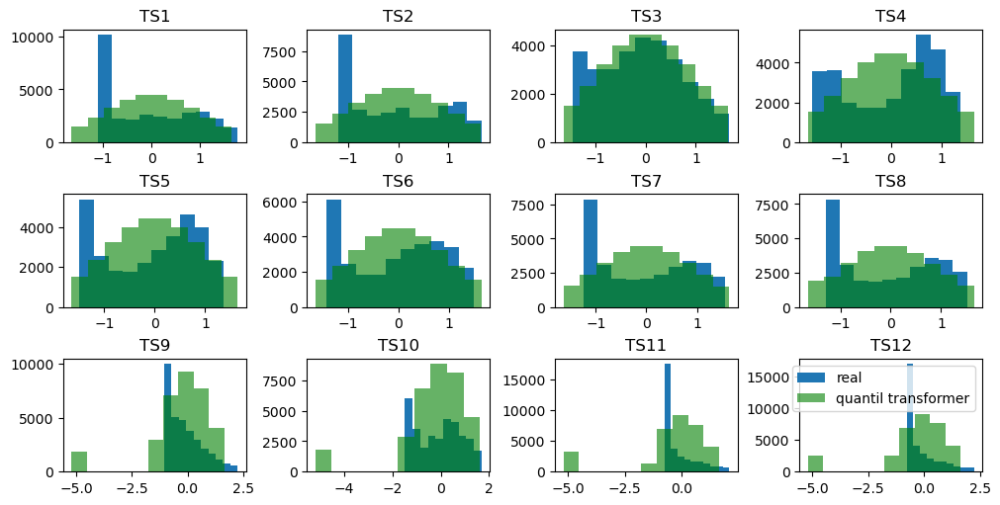

In [13]:
fig, axes = plt.subplots(3, 4, figsize=(10,5), constrained_layout=True)
i = 0
for x in range(3):
    for y in range(4):
        data.iloc[:, i][data.iloc[:, i].between(data.iloc[:, i].quantile(.05), data.iloc[:, i].quantile(.95))].hist(ax=axes[x,y])
        data_qt.iloc[:, i][data_qt.iloc[:, i].between(data_qt.iloc[:, i].quantile(.05), data_qt.iloc[:, i].quantile(.95))].hist(color='green',alpha=0.6, ax=axes[x,y])
        axes[x,y].title.set_text(data.columns[i])
        axes[x,y].grid(False)
        i += 1
plt.legend(['real', 'quantil transformer'])


#### Prueba quantil transformer con caso de CD

In [14]:
#path = '../../Datasets/TELCO/'
path = "/home/gastong/Documentos/TELCO/v0/" #Rosaluna
filenames = ["TELCO_data_2022_01.zip", "TELCO_data_2022_02.zip", "TELCO_data_2022_03.zip", "TELCO_data_2022_04.zip"]
files = [path+ i for i in filenames]

In [15]:
# Load data and predictions
# Read CSV files from List
data = pd.concat(map(pd.read_csv, files))
data = set_index(data)
data = preprocessing(data, flag_scaler=False, outliers=True)
data

,TS1,TS2,TS3,TS4,TS5,TS6,TS7,TS8,TS9,TS10,TS11,TS12
time,,,,,,,,,,,,
2022-01-01 00:00:00,0.950918,0.331853,1.044191,1.080015,0.478342,0.234028,0.696214,0.714023,0.004377,1.603301,-0.674944,-0.701202
2022-01-01 00:05:00,0.953790,0.308883,1.044191,1.018991,0.333611,-0.095064,0.557168,0.445282,0.004377,1.603301,-0.674944,-0.701202
2022-01-01 00:10:00,0.771174,0.242527,1.190647,0.863153,0.548832,-0.031327,0.422607,0.250676,0.004377,1.603301,-0.674944,-0.701202
2022-01-01 00:15:00,0.612978,0.213496,1.190647,1.074681,0.298016,-0.175711,0.448379,0.259943,-0.405597,0.545695,-0.699482,-0.720646
2022-01-01 00:20:00,0.830040,0.138526,0.392594,0.931433,0.140246,-0.234245,0.688942,0.463816,-0.405597,0.545695,-0.699482,-0.720646
...,...,...,...,...,...,...,...,...,...,...,...,...
2022-04-30 23:35:00,0.352983,-0.074581,0.506275,1.533222,0.487076,0.141674,0.561459,0.334079,1.553126,2.308372,-0.468192,-0.497042
2022-04-30 23:40:00,0.180603,-0.022261,1.169986,2.465266,0.307368,-0.041733,0.320081,0.185808,1.553126,2.308372,-0.468192,-0.497042
2022-04-30 23:45:00,0.117753,-0.161036,1.169986,2.027793,-0.209240,-0.092462,0.525684,0.287744,-0.049580,1.074498,-0.388861,-0.428989


In [16]:
qt = QuantileTransformer()

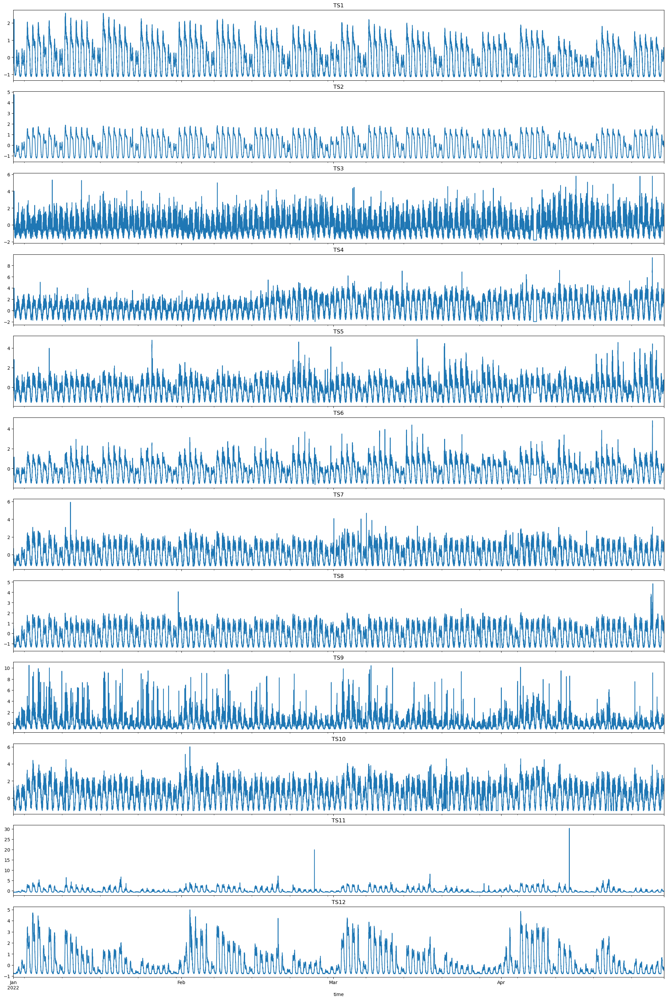

In [17]:
#define number of rows and columns for subplots
nrow=12
ncol=1

columns_list = data.columns

time_start = '2022-01-01'
time_end = '2022-04-30'
fig, axes = plt.subplots(nrow, ncol, figsize=(20,30), constrained_layout=True, sharex=True)

# plot counter
count=0

for r in range(nrow):
    for c in range(ncol):
        data[columns_list[count]][time_start:time_end].plot(ax=axes[r])
        axes[r].set_title(columns_list[count])
        count+=1

In [18]:
data_qt = qt.fit_transform(data)
data_qt = pd.DataFrame(data_qt, index=data.index, columns=data.columns)

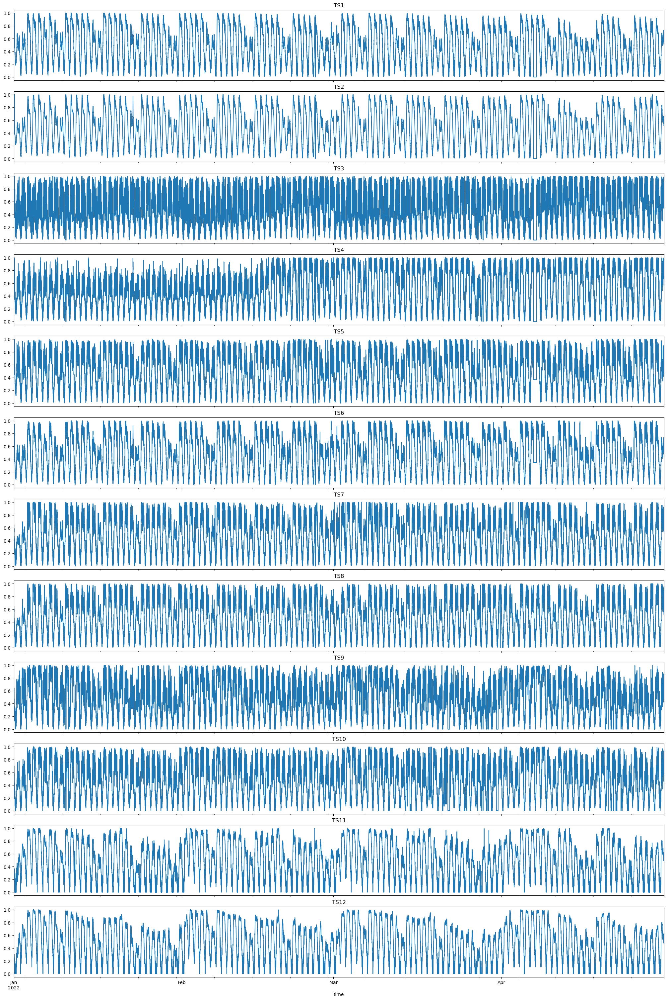

In [19]:
#define number of rows and columns for subplots
nrow=12
ncol=1

columns_list = data_qt.columns

time_start = '2022-01-01'
time_end = '2022-04-30'
fig, axes = plt.subplots(nrow, ncol, figsize=(20,30), constrained_layout=True, sharex=True)

# plot counter
count=0

for r in range(nrow):
    for c in range(ncol):
        data_qt[columns_list[count]][time_start:time_end].plot(ax=axes[r])
        axes[r].set_title(columns_list[count])
        count+=1

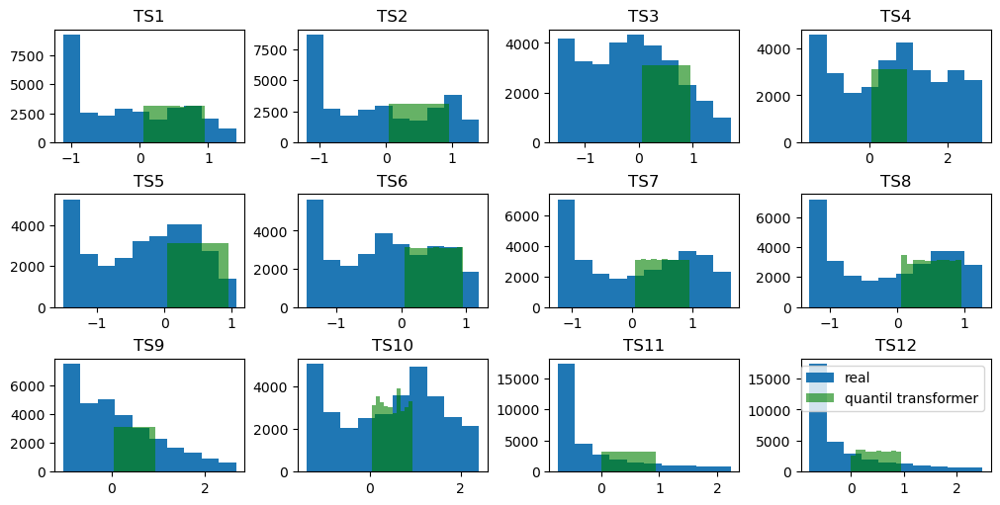

In [20]:
fig, axes = plt.subplots(3, 4, figsize=(10,5), constrained_layout=True)
i = 0
for x in range(3):
    for y in range(4):
        data.iloc[:, i][data.iloc[:, i].between(data.iloc[:, i].quantile(.05), data.iloc[:, i].quantile(.95))].hist(ax=axes[x,y])
        data_qt.iloc[:, i][data_qt.iloc[:, i].between(data_qt.iloc[:, i].quantile(.05), data_qt.iloc[:, i].quantile(.95))].hist(color='green',alpha=0.6, ax=axes[x,y])
        axes[x,y].title.set_text(data.columns[i])
        axes[x,y].grid(False)
        i += 1
plt.legend(['real', 'quantil transformer'])

#### Prueba de quitar el CD del entrenamiento y ver cómo queda la transformación

In [21]:
qt = QuantileTransformer()
#ajusto los parámetros solo con enero
qt.fit(data[:'2022-01-31'])
# y transformo todo
data_qt = qt.transform(data)
data_qt = pd.DataFrame(data_qt, index=data.index, columns=data.columns)

In [22]:
data_qt

,TS1,TS2,TS3,TS4,TS5,TS6,TS7,TS8,TS9,TS10,TS11,TS12
time,,,,,,,,,,,,
2022-01-01 00:00:00,0.822293,0.646180,0.895752,0.841811,0.809749,0.671672,0.644603,0.737237,0.527787,0.814815,0.319926,0.313814
2022-01-01 00:05:00,0.823293,0.641769,0.895752,0.813625,0.733804,0.561562,0.605167,0.637137,0.527787,0.814815,0.319926,0.313814
2022-01-01 00:10:00,0.747089,0.628629,0.918910,0.740471,0.846992,0.588589,0.573563,0.578579,0.527787,0.814815,0.319926,0.313814
2022-01-01 00:15:00,0.692047,0.621225,0.918910,0.838835,0.712349,0.528529,0.578582,0.581081,0.354920,0.493994,0.269760,0.281782
2022-01-01 00:20:00,0.777841,0.601736,0.729718,0.776349,0.633634,0.503504,0.642208,0.643644,0.354920,0.493994,0.269760,0.281782
...,...,...,...,...,...,...,...,...,...,...,...,...
2022-04-30 23:35:00,0.632377,0.537105,0.770563,0.954250,0.814528,0.646647,0.606081,0.603103,0.857516,0.947948,0.510767,0.499499
2022-04-30 23:40:00,0.587635,0.551854,0.916591,0.995174,0.718176,0.584084,0.549250,0.559059,0.857516,0.947948,0.510767,0.499499
2022-04-30 23:45:00,0.568262,0.507257,0.916591,0.987127,0.486964,0.562896,0.597189,0.589590,0.505774,0.665165,0.548275,0.531031


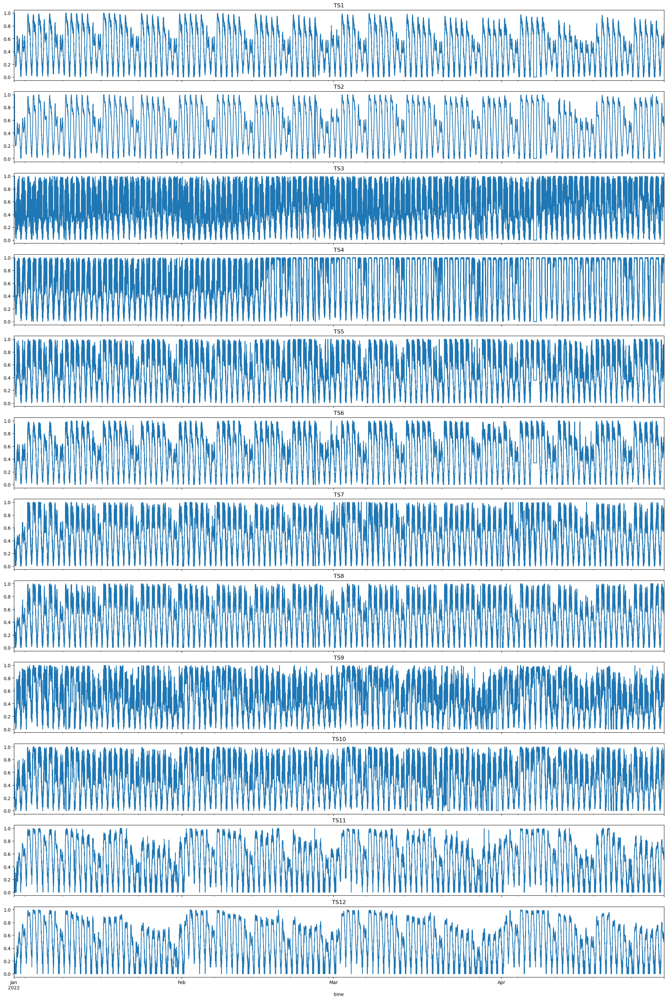

In [23]:
#define number of rows and columns for subplots
nrow=12
ncol=1

columns_list = data_qt.columns

time_start = '2022-01-01'
time_end = '2022-04-30'
fig, axes = plt.subplots(nrow, ncol, figsize=(20,30), constrained_layout=True, sharex=True)

# plot counter
count=0

for r in range(nrow):
    for c in range(ncol):
        data_qt[columns_list[count]][time_start:time_end].plot(ax=axes[r])
        axes[r].set_title(columns_list[count])
        count += 1

In [24]:
data_inverse = qt.inverse_transform(data_qt)
data_inverse = pd.DataFrame(data_inverse, index=data.index, columns=data.columns)

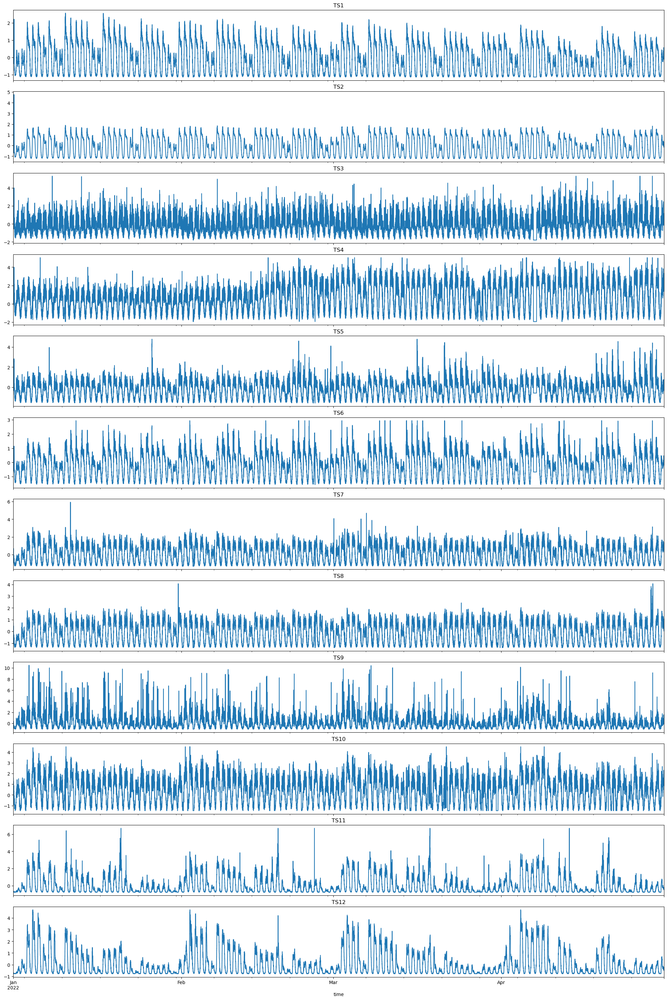

In [25]:
#define number of rows and columns for subplots
nrow=12
ncol=1

columns_list = data_inverse.columns

time_start = '2022-01-01'
time_end = '2022-04-30'
fig, axes = plt.subplots(nrow, ncol, figsize=(20,30), constrained_layout=True, sharex=True)

# plot counter
count=0

for r in range(nrow):
    for c in range(ncol):
        data_inverse[columns_list[count]][time_start:time_end].plot(ax=axes[r])
        axes[r].set_title(columns_list[count])
        count += 1